# HW 3: Lightfields

**HW credits:** *Florian Schiffers and Oliver Cossairt, Northwestern University, Computational Photography [CS331](https://nucs331.github.io/)*

Computational Photography, ELEC 549, Fall 2023, Rice University,

Instructor: Ashok Veeraraghavan

Authors: Florian Schiffers, Sean Farrell, Aniket Dashpute

------


# Part 2: Light Field Acquisition and Rendering

This is part 2 of homework 3. In this part of the homework you will capture your own light field waving a smartphone/tablet camera around. The goal of this exercise is to use synthetic aperture photography principles and synthesize an image that appears to be captured with an aperture much larger than your smartphone/tablet camera's aperture [1].

The **advantage** of this technique is that captured images will appear to have a significantly smaller depth of field, giving the look and feel of a much more expensive camera. The other advantage is that, because we are capturing a light field, we can digitally refocus the image to any location we desire.

The **disadvantage** of this technique is that, because it relies on a sequential image capture, it will only work for static scenes. The technique requires the image sequence to be registered, and the quality of the final photograph will be limited by how well the images can be registered. In this homework, we will use a simple correlation (or template-matching) based registration scheme.

Reference:

[1] Synthetic aperture confocal imaging, Marc Levoy, Billy Chen, Vaibhav Vaish, Mark Horowitz, Ian McDowall, and Mark Bolas. 2004. ACM Trans. Graph. 23, 3 (August 2004), 825-834.

-----


In [1]:
# Information on autoreload: https://ipython.org/ipython-doc/3/config/extensions/autoreload.html
%load_ext autoreload
%autoreload 2

In [2]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [3]:
from google.colab import drive, files
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!pwd
!ls
%cd drive/MyDrive/Ashok_HW3_Code_and_Data/part2_light_field_rendering

/content
drive  sample_data
/content/drive/MyDrive/Ashok_HW3_Code_and_Data/part2_light_field_rendering


In [5]:
import glob
import numpy as np
import matplotlib.pyplot as plt
import cv2
import scipy
import scipy.misc
from matplotlib import gridspec
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np
import skimage

import os

import synthetic_aperture as synthetic_aperture
import code as code
import util_synthetic as util_synthetic

For implementing and debugging your algorithm we are providing you with a sample movie dataset, so that you can be sure that the data is good enough for the algorithm to work. Your own data might be not ideal (in case you do something wrong) and it might not be working because of the data you have acquired.

First you will load the video data into a large numpy array. Then you'll have to register each frame of the captured video using a correlation function and generate synthetic aperture photos.

Registration can be performed on either grayscale video frames or color images. You will use a simple template-matching scheme as described in the first lecture on image processing, but fortunately you don't have to implement this because there are many packages that do this for you.

Here are more detailed instructions on what you need to do:

1.    Use the **DATALOADER:**: We wrote a program to load the video into an n-darray from an .mp4 file
2.    You can use all of the frames in the video, but this may make your processing slow if you captured more than a few seconds of video. You should be able to get away with selecting about 50 to 60 frames for processing (for instance by selecting only every few frames).
3.    The red box in Figure 2 shows the template that was used for registration. You will need to select a similar template from the first frame of your video. You will then search for a match to this template in successive frames. The location of the match will tell you how many pixels your camera has shifted. Choose a size for this template (i.e. 16x16 pixels). You may need to adjust this to improve your results.
4.    You only need to search for a template match within a window of your target frame. The window should be centered on the location of the template in the first frame. The size of the window should be slightly larger than the sum of the template size and the maximum shift of the target object over the entire set of video frames.

## Task 1: Load in the Data
Here you will use the prebuilt function we gave you to convert a video into a numpy array image stack.

In [56]:
# After the implementation for this dataset you want to replace this with your own movie file
# For now you can keep it though
path = 'example_synthetic_aperture.MOV'
# path = 'amogus_lightfield.mp4'

In [57]:
# We're implementing this for you for the .mov file datatype.
# It might work for you movie files out-of-the-box. But must likely you'll
# need to adapt this slightly

imgs = util_synthetic.read_video_to_array(path)

imgs = imgs[:,:,:,::2] # only take every 10th frame

print(imgs.shape) # Should be (Num_x, Num_y, 3, Num_images)

(1080, 1920, 3, 112)


Text(0.5, 1.0, 'An example image from the dataset')

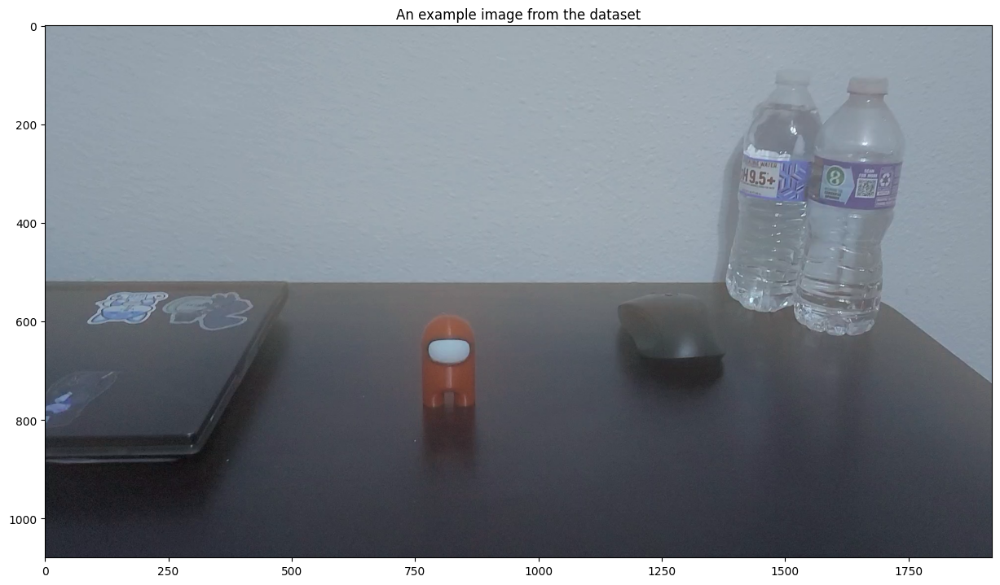

In [58]:
# Print a frame from the video, play around with the index to see that different
# images were loaded correctly
img_idx = 0
plt.figure(figsize=(15,15))
plt.imshow(imgs[:,:,:,0])
plt.title("An example image from the dataset")

## Task 2: Extract windows and template from the dataset
Now you will have to implement a function that crops the search window and the template out of the video data. You will return the cropped window for each frame and the template from to initial frame (the first one)

In [59]:
def crop_search_window(img, window_size, template_size, focus_center = None):
    """
    TODO:

    This function crops the windows and the template from the center of the first frame.

    The center of the template and window is defined by focus_center (e.g. 250,300). If focus_center is
    not passed as an argument (check with if focus_center == None ) , simply calculate the center of the image

    HINT: You need to calculate the top-left coordinate for both the window and the template
    where you want to start cropping

    You then can simply return these indices from your data.

    E.g. you could define something like

    x0 = 100
    y0 = 50
    x1 = x0 + size_x
    y1 = y0 + size y

    tmp = data[x0:x1,y0:y1]

    Args:
        template_size(int): This int (e.g. 20) s the size of the template which we are cropping from the first frame of the video.
        window_size(int): Windows size (e.g. 120), should be larger than template_size
        img(ndarray): Video data with shape ((272, 480, 3, 51))
        focus_center(list): 2D array which is where we want to focus at. If none simply take the center of the image

    Returns:
        windows(ndarray): Should be (window_size,window_size,3,num_mgs)
        template(ndarray): Should be (template_size,window_size,3) - only once for initial frame
        top_left_window(list): top-left index coordinates where we are cropping the window_size e.g. [100,400]
        top_left_template(list): top-left index coorinates where the template is cropped e.g. [110,410]

    """

    top_left_template = focus_center - template_size//2
    top_left_windows = focus_center - window_size//2

    windows = img[top_left_windows[0] : top_left_windows[0] + window_size, top_left_windows[1] : top_left_windows[1] + window_size]
    template = img[top_left_template[0] : top_left_template[0] + template_size, top_left_template[1] : top_left_template[1] + template_size]


    return windows, template, top_left_windows, top_left_template

In [60]:
window_size = 150#120 # The size of the window. You can vary this if wanted. 150
template_size = 30#100 # The template size. This parameter might need to be varied to work well 30

focus_center = (120, 210)#(65,65)

window, template, top_left_search_window, top_left_template= synthetic_aperture.crop_search_window(imgs,window_size,template_size,focus_center)


print(window.shape) # Should be (window_size,window_size,3,num_mgs)
print(template.shape) # Should be (template_size, template_size, 3)

print("Top-Left Corner of Search Window")
print(top_left_search_window) # 1D array with 2 entries for x and y
print("Top-Left Corner of Template Window")
print(top_left_template) # 1D array with 2 entries for x and y

(120, 210)
(150, 150, 3, 112)
(30, 30, 3)
Top-Left Corner of Search Window
(45, 135)
Top-Left Corner of Template Window
(105, 195)


### Task 2.1: Visualize the Template and Windows
We have implemented a visualization function for you to sanity check if your cropping actually works.

Feel free to make any changes to this plotting function as you like. If you want to visualize something different please do!

Save Name:  ./my_output_synthetic/image_window_and_template.png


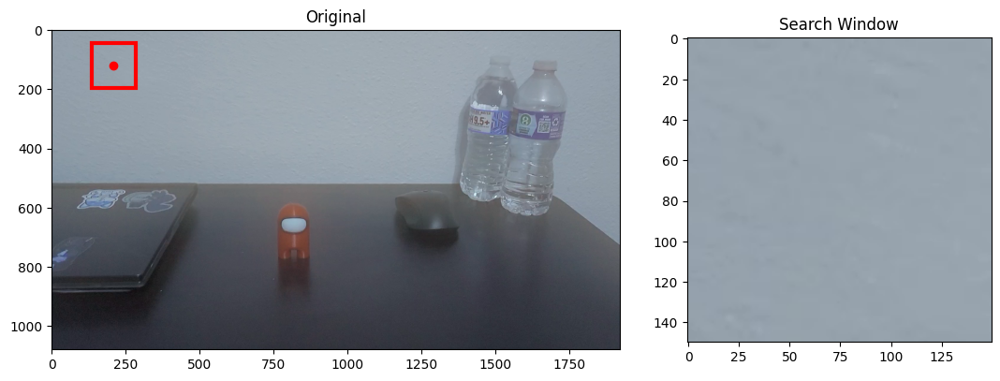

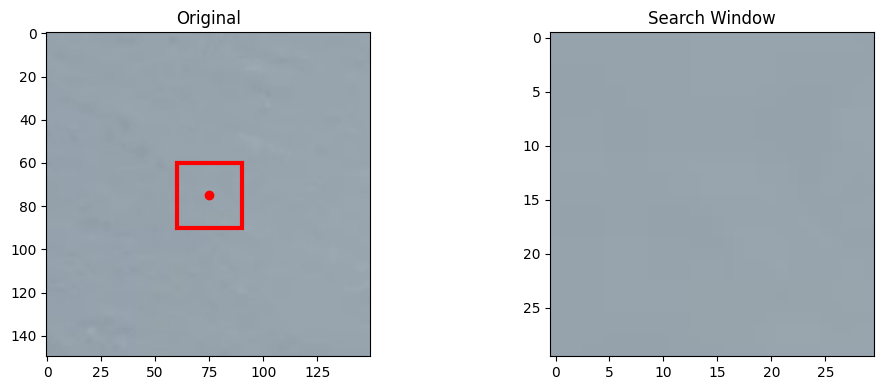

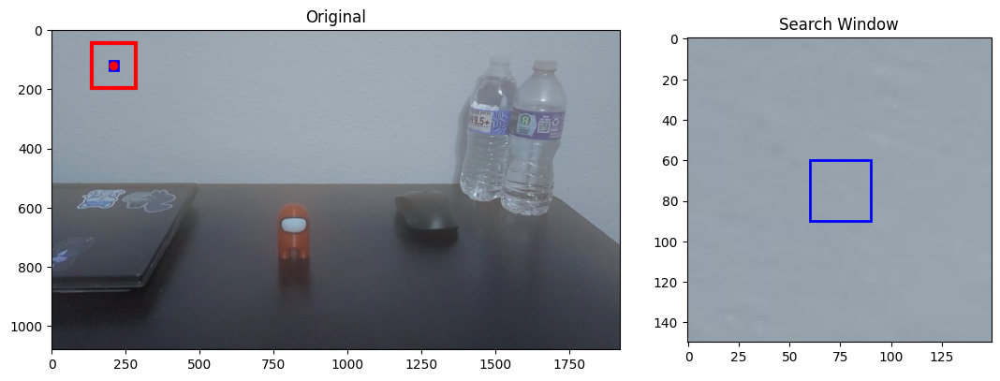

In [62]:
imgnum = 0
# 112 *2 images, take 112 in amogus

# This function also has the optional argument of plotting the used template
plt.figure(figsize=(11,4))
util_synthetic.plot_image_with_crop(imgs[:,:,:,imgnum],window[:,:,:,imgnum],top_left_search_window)

# This function also has the optional argument of plotting the used template
plt.figure(figsize=(11,4))
util_synthetic.plot_image_with_crop(window[:,:,:,imgnum],template[:,:,:])

# This function also has the optional argument of plotting the used template at the same time if you pass at is an argument
plt.figure(figsize=(11,4))
util_synthetic.plot_image_with_crop(imgs[:,:,:,imgnum],window[:,:,:,imgnum],top_left_search_window,template,top_left_template)

util_synthetic.save_fig_as_png("image_window_and_template")

### Task 2.2 Visualize the captured light field in search window
Here you will print the search-window throughout the complete video data. You'll see how the camera has moved. This should remind you of what you did in Part 1 focused on the light field. However, now we do not know what the exact position's of the camera were as we moved it around. This will be a critical component you will need to estimate in this homework. (sound familiar...optical flow)

Save Name:  ./my_output_synthetic/visualize_pixelshift.png


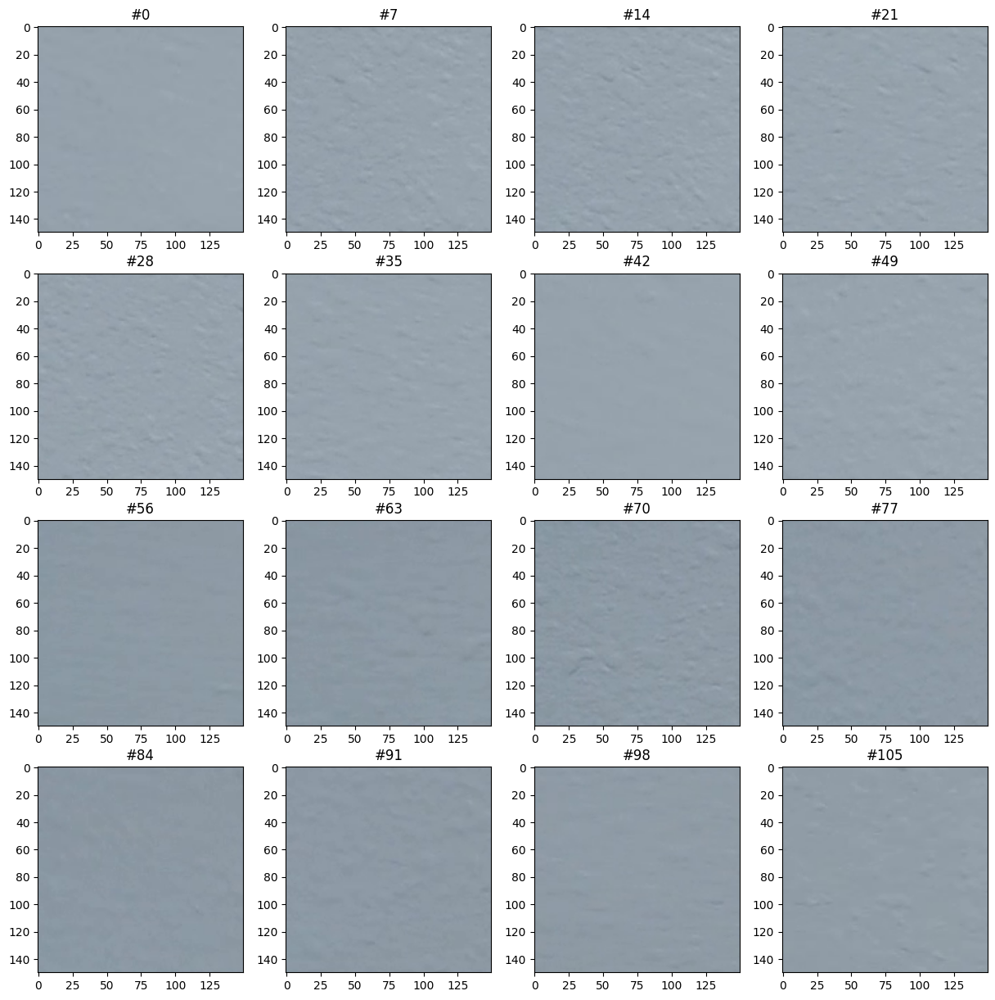

In [63]:
plt.figure(figsize=(15,15))
util_synthetic.visualizePixelShift(window)

util_synthetic.save_fig_as_png("visualize_pixelshift")

## Task 3: Template Matching
In this section different similarity metrics are defined and then applied to the light field images.

### Task 3.1: Mathematically define different template matching algorithms
We will define the template $T$ as size $P\times P$ pixels and a window $W$ where will search over as size $Q\times Q$ where $Q > P$. We suggest using the normalized cross correlation (NCC) metric to determine the similarity between the template and a sub-section of the window. You can compute the NCC at pixel $[i,j]$ in the window as:

\begin{equation}
NCC[i,j] = \frac{\sum_{m,n \in P}(T[m,n] - \bar{T})(W[i+m,j+n] - \bar{W})}{\sqrt{\sum_{m,n \in P}(T[m,n] - \bar{T})^2 \sum_{m,n \in P}(W[i+m,j+n] - \bar{W})^2}}
\end{equation}
where $\bar{T}$ is the mean of the template pixels and $\bar{W}$ is the mean of the pixels within the subsection of the window that is being compared to the template.

You can implement your own function or use another similarity metric such as sum of square differences (SSD) or sum of absolute differences (SAD). However, to save you time you can simply use many of the **pre-implemented** correlation functions availible in several Python packages, such as openCV. We will walk you through this in the following sections.

Once you have calculated the correlation functions, you can find the pixel shift $[s_x,s_y]$ for each frame in the video using the following computation:
\begin{equation}
  [s_x,s_y] = \underset{i,j}{\mathrm{argmax}}\, NCC[i,j]
\end{equation}

### Task 3.2: Template matching on the same image
We recommend using OpenCV's template mathcing fuction to do time-efficient mathcing. Implement the function below "findCorrelation" to determine the pixel position where the template has max similarity within the search window

You can read more on this function here:

https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_template_matching/py_template_matching.html

In [64]:
def findCorrelation(img,template,method='cv2.TM_CCOEFF_NORMED'):
    """
    TODO:

    Correlate the window-search image with the template.
    You can use the cv2.matchTemplate function for this and then use
    cv2.minMaxLoc to get the maximum correlation value

    HINT: To use cv2.matchtemplate you need to initialize method_cv = eval(method)
    and then pass method_cv into the cv2.matchTemplate function

    Args:
        img(ndarray): RGB image of the window
        template(ndarray): RGB image of the template (shape should be smaller than img)
        method(str): the correlation method you want to use.
        By default we're using only cv2.TM_CCOEFF_NORMED, but feel free to test out
        different methods

    Returns:
        Res(ndarray): correlation image (gray scale, size defined as in cv2-documentation )
        top_left(ndarray): the location of the maximum in the correlation image cast to int (not uint8)

    '"""

    method_cv = eval(method)
    img = np.transpose(img, (1, 0, 2))
    template = np.transpose(template, (1, 0, 2))
    res = cv2.matchTemplate(img, template, method_cv)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    max_loc = np.array([max_loc[0], max_loc[1]])
    temp = max_loc[0]
    max_loc[0] = max_loc[1]
    max_loc[1] = temp

    res = np.transpose(res, (1, 0))

    return res, max_loc

In [65]:
# These are the methods of finding correlation between the template and a part of the frame

methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

# We will be using "cv2.TM_CCOEFF_NORMED" since this works reasonable well.
# But you're free to use different versions of this!
method = methods[1]
print(method)

cv2.TM_CCOEFF_NORMED


In [66]:
# Let's correlate the template with the original. You will have to implement this function
print(window[:,:,:,0].shape)
print(template.shape)
res,top_left_correlation = findCorrelation(window[:,:,:,0],template,method)

(150, 150, 3)
(30, 30, 3)


[60 60]
(121, 121)
Save Name:  ./my_output_synthetic/image_correlation.png


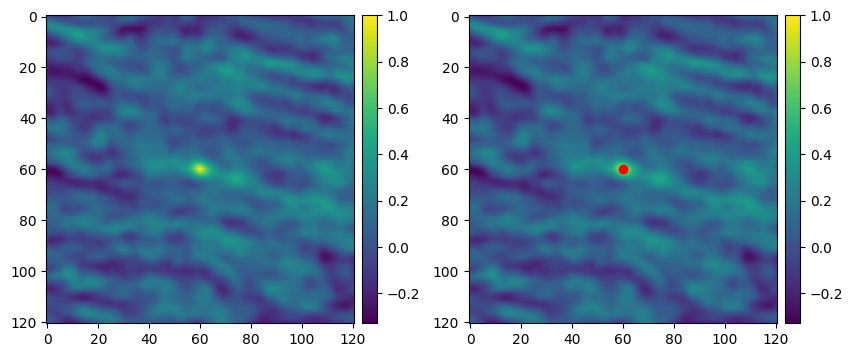

In [67]:
# Let's visualize the output. We've already implemented this for you,
# so this should work just by executing this cell

print(top_left_correlation)
print(res.shape)

plt.figure(figsize=(10,4))

plt.subplot(121)
im = plt.imshow(res)
util_synthetic.add_colorbar(im)

plt.subplot(122)
im = plt.imshow(res)
util_synthetic.add_colorbar(im)
plt.scatter(top_left_correlation[0],top_left_correlation[1],color='r')

util_synthetic.save_fig_as_png("image_correlation")

### Task 3.3: Template matching on a different image

Top left correlation location:  [91 62]
Save Name:  ./my_output_synthetic/image_correlation_different_frame.png


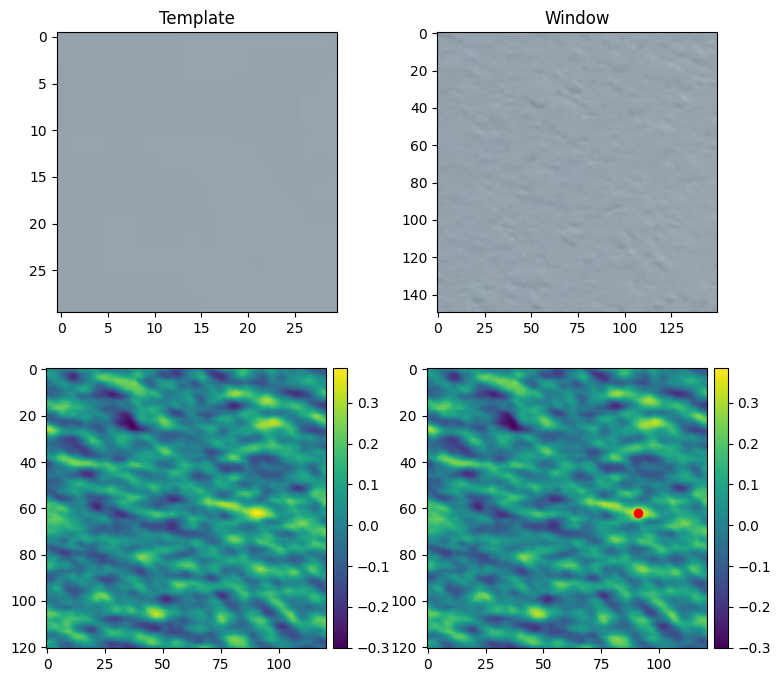

In [68]:
# Now lets correlate the template with a different frame!
img_idx = 14    #select which window/frame to grab
res,top_left_correlation = findCorrelation(window[:,:,:,img_idx],template)
print("Top left correlation location: ",top_left_correlation)

# When we visualize this, you'll hopefully realize that the correlation maximum-spot has now slightly moved to a different positions!
plt.figure(figsize=(9,8))

plt.subplot(2,2,1)
plt.imshow(template)
plt.title('Template')

plt.subplot(2,2,2)
plt.imshow(window[:,:,:,img_idx].squeeze())
plt.title('Window')
plt.subplot(2,2,3)
im = plt.imshow(res)
util_synthetic.add_colorbar(im)

plt.subplot(2,2,4)
im = plt.imshow(res)
util_synthetic.add_colorbar(im)
plt.scatter(top_left_correlation[0],top_left_correlation[1],color='r')

util_synthetic.save_fig_as_png("image_correlation_different_frame")

### Task 3.4: Template matching over all images
Now you have to implement a function that correlates your template against all images from your recorded video. Simply loop through all frames and apply the "findCorrelation" function that you implemented above.

In [69]:
def findCorrelationAll(imgs,template,method='cv2.TM_CCOEFF_NORMED'):
    """
    TODO:

    Correlates all images in the video stack with the template function

    HINT: Loop through all frames and use the findCorrelation function
    to perform the correlation.

    The output size of the correlated image is a different size than the input,
    hence you need to calculate it if you want to initialize your result image
    before the for-loop

    See documentation here:
    https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_template_matching/py_template_matching.html

    Args:
        imgs(ndarray): RGB video of the window with shape (Nx,Ny,3,Num_imgs)
        template(ndarray): RGB image of the template (shape should be smaller than img)
        method(str): the correlation method you want to use.
        By default we're using only cv2.TM_CCOEFF_NORMED, but feel free to test out
        different methods

    Returns:
        Res(ndarray): correlation video (gray scale, size defined as in cv2-documentation )
        top_left(ndarray): the location of the maximum in the correlation image  for each frame. This should be cast to int (not uint8) as np.array
        with shape (2, num_images)

    """

    # bypass: do the first frame to get the correct shape, then do the rest of the frames lmao
    first_frame_corr, first_topleft = findCorrelation(imgs[:,:,:,0], template, method)
    Res = np.zeros((imgs.shape[-1], first_frame_corr.shape[0], first_frame_corr.shape[1]))
    Top_left = np.zeros((2, imgs.shape[-1]))

    Res[0, :, :] = first_frame_corr
    Top_left[:,0] = first_topleft

    for frame in range(1, imgs.shape[-1]):
      Res[frame, :,:] , Top_left[:, frame] = findCorrelation(imgs[:,:,:,frame], template, method)

    return Res, Top_left

In [70]:
correlated, top_left_correlated_list = findCorrelationAll(window,template,method)

print(correlated.shape) # Should be (Num_imgs,W-w+1,W-w+1) with W window size and w template size
print(type(top_left_correlated_list)) # Should be a ndarray
print(top_left_correlated_list.shape) # should be 2 x Num_imgs
print(top_left_correlated_list.dtype) # should be integer

(112, 121, 121)
<class 'numpy.ndarray'>
(2, 112)
float64


Visualize all the correlation images and save the resulting figure

Save Name:  ./my_output_synthetic/correlation_all_frames.png


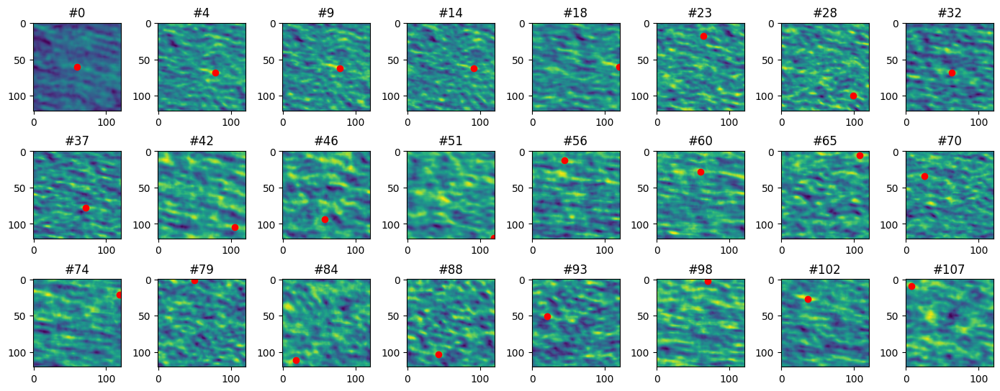

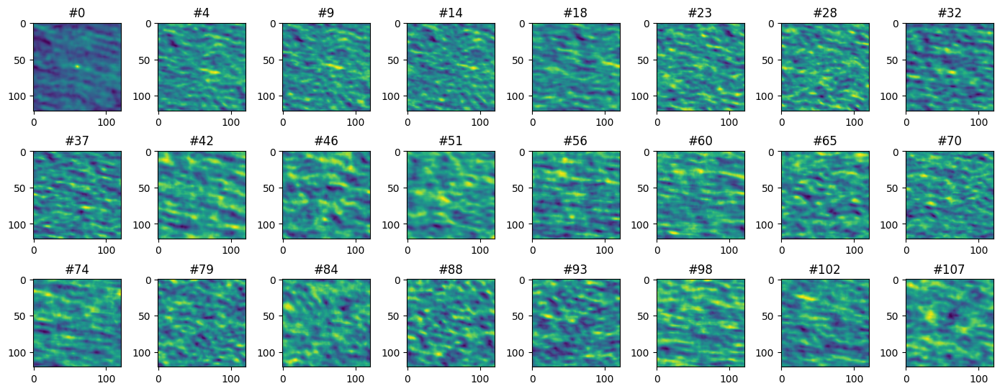

In [71]:
# Make sure that the maximum spot (the red one) overlays with the visible maximum in the correlation images

# Plot with maximum point denoted
plt.figure(figsize = (14,5.5))
util_synthetic.visualize_correlation_output(correlated,top_left_correlated_list,True)

# plot without the maximal point shown to verify that there is actually an minimum
plt.figure(figsize = (14,5.5))
util_synthetic.visualize_correlation_output(correlated,top_left_correlated_list,False)

util_synthetic.save_fig_as_png("correlation_all_frames")

In [72]:
# Print some statistics about the correlated images
print(correlated.shape)
print(imgs.shape)
print(template.shape)
print(window.shape)
print(top_left_correlated_list)

(112, 121, 121)
(1080, 1920, 3, 112)
(30, 30, 3)
(150, 150, 3, 112)
[[ 60.  63.  64.  80.  79.  75.  75.  78.  77.  78.  78.  80.  81.  86.
   91.  97. 105. 113. 120. 112. 119. 119.  57.  64.  71.  98.  15.  34.
   99. 106. 115.   0.  63.  23.  32.  46.  58.  72.   9.   7.  43.  71.
  105.  48.  81.  74.  58.  41. 105.  70.  61. 119. 114.  68.   8.   3.
   45.  31.  85.  87.  60.  61.  43.  72.  72. 108.  75.  64.  52.  46.
   25.  19.   9.   3. 118.  34.   0.  25.  26.  50. 107. 120.  37.  74.
   18.  31. 116.  45.  43.  40.  12.  68.  13.  21.  30.  36.  52.  40.
   70.   8.  71.   0.  36.  56.  99. 112.  53.   7.  15. 108. 106.  44.]
 [ 60.  68.  67.  70.  68.  66.  64.  63.  63.  62.  62.  62.  63.  63.
   62.  61.  61.  60.  60.  54.  52.  51.  19.  18.  18.  90.  70.  40.
  100.  13.  14.  72.  68.  76.  77.  79.  80.  78.  59.  60. 110.   3.
  105.  25.  40.  29.  94.  50.  20.  56.  64. 120.  79. 113.  73. 108.
   12.  20.  22.  25.  28.  33.  13.  36.   2.   6.  33.  70.  71. 

## Task 4: Use correlation images to correct pixel shifts
Now we will have to add the template size to pixel_shifts that you have just calculated to get the coordinates in the original image coordinates!

WHY: Have a look at the output image of the correlated images. This is specific to the correlation function as implemented in openCV.

See documentation here: https://docs.opencv.org/master/d4/dc6/tutorial_py_template_matching.html

HINT: If input image is of size (WxH) and template image is of size (wxh), output image will have a size of (W-w+1, H-h+1). Once you got the result, you can use cv.minMaxLoc() function to find where is the maximum/minimum value. Take it as the top-left corner of rectangle and take (w,h) as width and height of the rectangle. That rectangle is your region of template.

In [73]:
def correct_correlation_result_to_image_coordinates(top_left_correlated_list,imgs,window,template):
    """
    TODO:

    The coordinate outputs of the openCV correlation don't match up with the original coordinates.

    Look up the required formula to convert the retrieved pixel locations from the video stack
    back into the original coordinate system

    Find more here: https://docs.opencv.org/master/d4/dc6/tutorial_py_template_matching.html

    HINT: This a one linear. Essentially you only have to add a constant. But we'll
    leave it up to you to figure out which constant needs to be added!

    HINT2: Not all inputs need to be used :) Think about what you actually need!


    Args:
        top_left_correlated_list(ndarray): (2,Num_imgs), the location of the correlation maximum for each image
        imgs(ndarray): pointer to the imgs
        window(ndarray): pointer to the data of the window
        template(ndarray): pointer to the template data

    Returns:
        out: ndarray(int) - The corrected pixel locations in original image space
    """

    print(window.shape, template.shape)
    out = np.zeros_like(top_left_correlated_list)
    print(focus_center, window.shape, template.shape)
    out[1] = top_left_correlated_list[0] + focus_center[0]//2 - window.shape[0]//2 + template.shape[0]//2 # - 1 + window.shape[0] #- template.shape[0] #+ imgs.shape[0] + 120
    out[0] = top_left_correlated_list[1] + focus_center[1]//2 - window.shape[1]//2 + template.shape[1]//2 # - 1 + window.shape[1] #- template.shape[1] #+ imgs.shape[1] + 210

    # out = top_left_correlated_list + np.array([120, 210])

    out = np.asarray(out, dtype=int)
    return out

In [74]:
# You need to implement this function
top_left_correlated = correct_correlation_result_to_image_coordinates(top_left_correlated_list,imgs,window,template)

print(top_left_correlated.dtype) # Should be int
print(top_left_correlated.shape) # should be 2 x Num_imgs

(150, 150, 3, 112) (30, 30, 3)
(120, 210) (150, 150, 3, 112) (30, 30, 3)
int64
(2, 112)


In [75]:
top_left_correlated[:, 0], top_left_correlated[:, 2]

(array([105,  60]), array([112,  64]))

In [76]:
top_left_correlated_list, top_left_correlated

(array([[ 60.,  63.,  64.,  80.,  79.,  75.,  75.,  78.,  77.,  78.,  78.,
          80.,  81.,  86.,  91.,  97., 105., 113., 120., 112., 119., 119.,
          57.,  64.,  71.,  98.,  15.,  34.,  99., 106., 115.,   0.,  63.,
          23.,  32.,  46.,  58.,  72.,   9.,   7.,  43.,  71., 105.,  48.,
          81.,  74.,  58.,  41., 105.,  70.,  61., 119., 114.,  68.,   8.,
           3.,  45.,  31.,  85.,  87.,  60.,  61.,  43.,  72.,  72., 108.,
          75.,  64.,  52.,  46.,  25.,  19.,   9.,   3., 118.,  34.,   0.,
          25.,  26.,  50., 107., 120.,  37.,  74.,  18.,  31., 116.,  45.,
          43.,  40.,  12.,  68.,  13.,  21.,  30.,  36.,  52.,  40.,  70.,
           8.,  71.,   0.,  36.,  56.,  99., 112.,  53.,   7.,  15., 108.,
         106.,  44.],
        [ 60.,  68.,  67.,  70.,  68.,  66.,  64.,  63.,  63.,  62.,  62.,
          62.,  63.,  63.,  62.,  61.,  61.,  60.,  60.,  54.,  52.,  51.,
          19.,  18.,  18.,  90.,  70.,  40., 100.,  13.,  14.,  72.,  68.,
   

### Task 4.1: Visualize the corrected pixel locations
You can use the function "display_new_image_location" and "display_new_image_location_all" which we've already implemented for you to see if everything works correctly

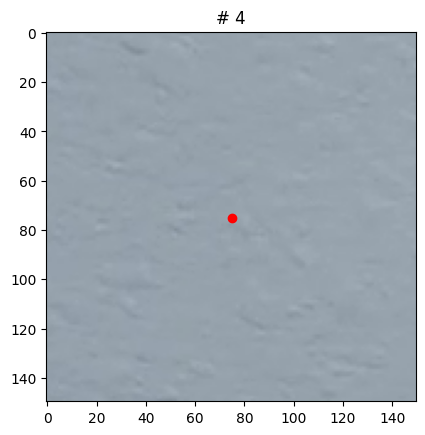

In [77]:
util_synthetic.display_new_image_location(imgs,top_left_correlated,top_left_search_window,window_size,4,False)

Executing the following cell (display_new_image_location_all) will show you an overview of the frames and will also display a red rectangle indicated where the match of the correlation function was found.

It should always show the same part of the image, however at different locations. If this is not the case, go back and try to debug where your problem might occur.

Save Name:  ./my_output_synthetic/display_new_image_location.png


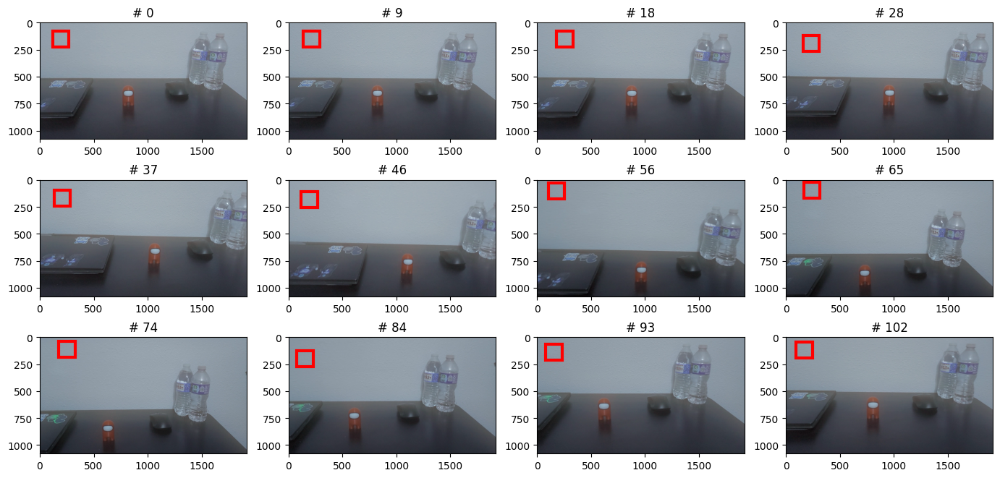

In [78]:
plt.figure(figsize=(17,8))
util_synthetic.display_new_image_location_all(imgs,top_left_correlated,top_left_search_window,window_size)

util_synthetic.save_fig_as_png("display_new_image_location")

### Task 4.2: Analyze the quality of the registration

When you execute the following cell, you will see the registered cropped image of the search window that you have chosen. These should look the same! But watch out carefully. They are only registered, however they are actually not the same because they are captured from different view positions.

The red mark denotes the center of the image. This should be the same feature in all those images since that's where the maximum peak in the correlation algorihtm has been identified. If the center of those images is not the feature that you have chosen, something went wrong you you should go back to your implementation and try to debug.

**Question for you:** Can you spot where other features in the search-window are not the same ?! This indicates that this is actually an approximation of a lightfield, similiar to Part 1 of the homework.

Save Name:  ./my_output_synthetic/display_new_location_cropped.png


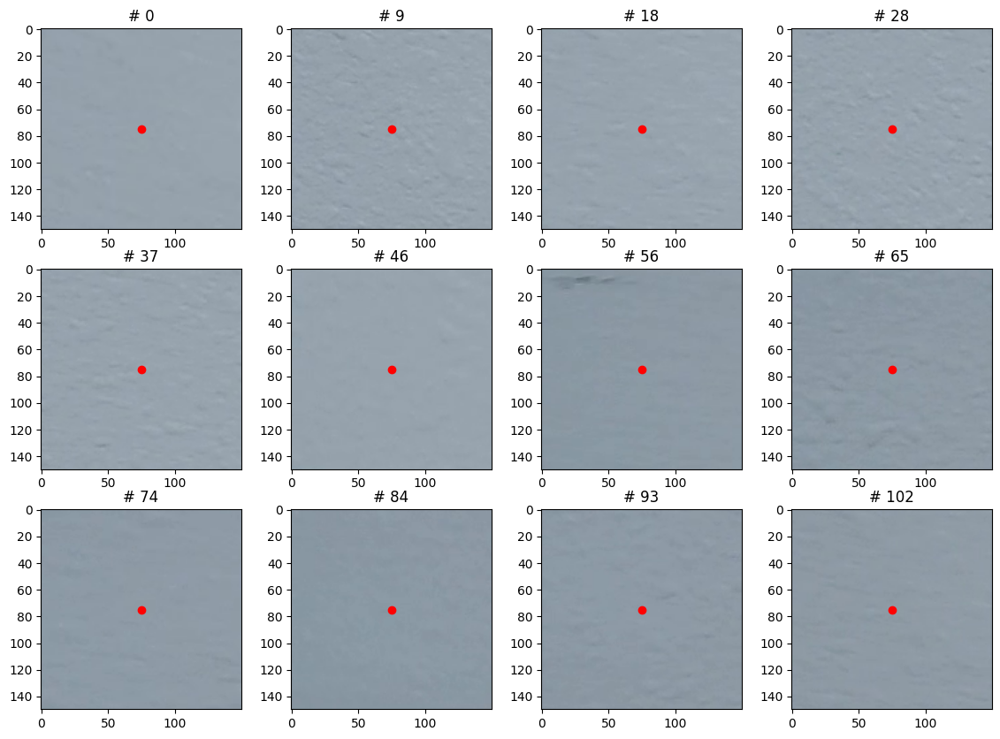

In [79]:
plt.figure(figsize=(14,10))
util_synthetic.display_new_image_location_all(imgs,top_left_correlated,top_left_search_window,window_size,display_full=False)

util_synthetic.save_fig_as_png("display_new_location_cropped")

### Task 4.3: Visualize the Pixel Shift Positions
Instead of visualizing pcitures, we are now plottin the camera viewpoint shift positions. We should see the trajectory that the smartphone camera took. This should be an almost zig-zag curve which approximately covers a 2D grid, similar to the lightfield capture from Part 1.

In [80]:
def calculate_pixel_shifts(top_left_correlated):
    """
    TODO:

    calculate_pixel_shifts calculate the registration shift between each frame in the video
    compared to the first frame.

    I.e. the pixel shift for the first frame would be (0,0) but different for all the others.

    Simply substract the other shifts from the first one to get the wanted output!

    Args:
        top_left_correlated_list(ndarray): (2,Num_imgs), the location of the correlation maximum for each image

    Returns:
        pixel_shifts(ndarray): The pixel shifts between different frames

    """
    # top left correlated is y, x
    # top left correlated list is x, y

    pixel_shifts = np.zeros_like(top_left_correlated)
    for frame in range(1, top_left_correlated.shape[1]):
      pixel_shifts[:, frame] = top_left_correlated[:, frame] - top_left_correlated[:, 0]

    return pixel_shifts

Save Name:  ./my_output_synthetic/pixel_shifts_zig_zag.png


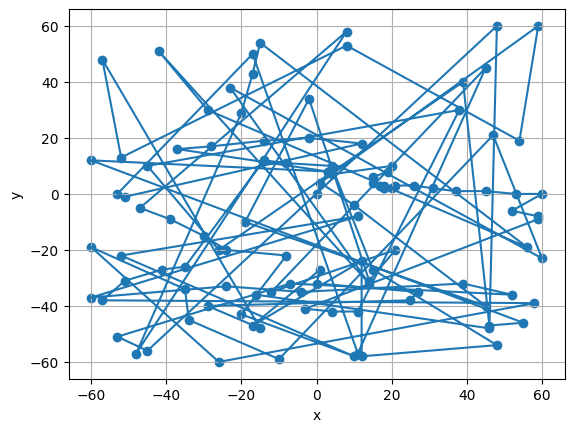

In [81]:
pixel_shifts = calculate_pixel_shifts(top_left_correlated)

# Plot the camera trajectory
plt.scatter(pixel_shifts[1],pixel_shifts[0])
plt.plot(pixel_shifts[1],pixel_shifts[0])

plt.xlabel("x")
plt.ylabel("y")
plt.grid()

util_synthetic.save_fig_as_png("pixel_shifts_zig_zag")

## Task 5: Refocusing the Light Field
In the rest of the assignment you will implement algorithms to refocus the captured light field to any position in the image.

Once you have calculated the pixel shift, you can generate a synthetic aperture photograph simply by shifting the images of each frame in the video in the opposite direction and then sum the up the result. **Think about why it has to be shifted in the negative direction**

If $f_i$ is the $i^{th}$ video frame, and $s_x^i$ and $s_y^i$ are the shifts for that frame, then you can simply calculate the synthetic aperture photograph using,
\begin{equation}
P[n,m] = \sum_{i=1}^N f_i[n-s_x^i, m-s_y^i]
\end{equation}

**Question for you:** Can you see the resemblance to the refocusing equation in Part 1 of the homework? This is actually quite similar!

### Task 5.1 Translate one image
First we will translate the images with the amount specified by the pixel_shift. For this you will have to implement a simple translate_image method. You can use any package of your liking to accomplish this. I recommend using openCV for speed.

HINT: You can use parts of your implementation from Part 1 for this.

In [82]:
def translate_image(img,dy,dx):
    """
    TODO:

    Translates an image by dx and dy. You can use
    cv2.warpAffne for this.
    HINT: Look at the function in part1. You can probably resuse your code!

    Args:
        img(ndarray): Rgb array to be shifted
        dx(float): amount to be shifted in x-direction
        dy(float): amount to be shifted in y-direction

    Returns:
        translated_image(ndarray): translated image, same shape as input.
    """
    # want input to be x, y

    rows, cols = img.shape[:2]

    # Define the translation matrix
    translation_matrix = np.float32([[1, 0, dx], [0, 1, dy]])

    # Apply the translation
    if len(img.shape) == 2:  # Grayscale image
        translated_image = cv2.warpAffine(img, translation_matrix, (cols, rows), borderMode=cv2.BORDER_CONSTANT)
    else:  # Color image
        # print("doing it aaahh")
        translated_image = cv2.warpAffine(img, translation_matrix, (cols, rows), borderMode=cv2.BORDER_CONSTANT)

    # print(np.max(translated_image - img))

    return translated_image

uint8
-21 -3
45 195 135 285


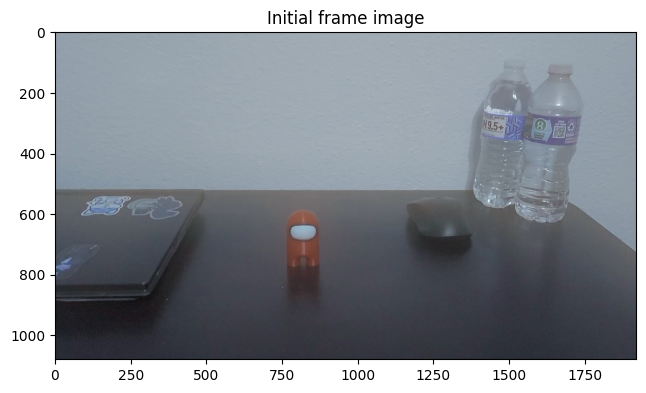

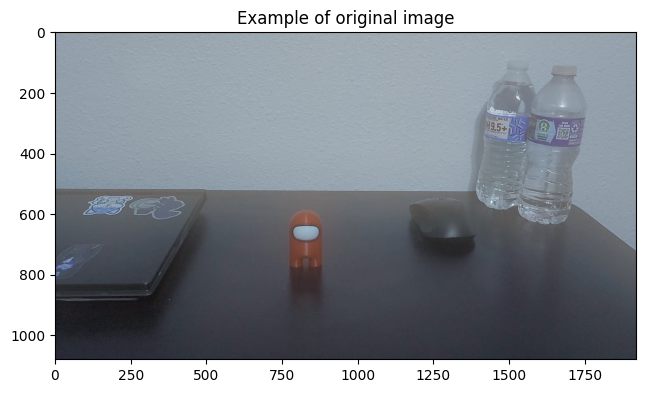

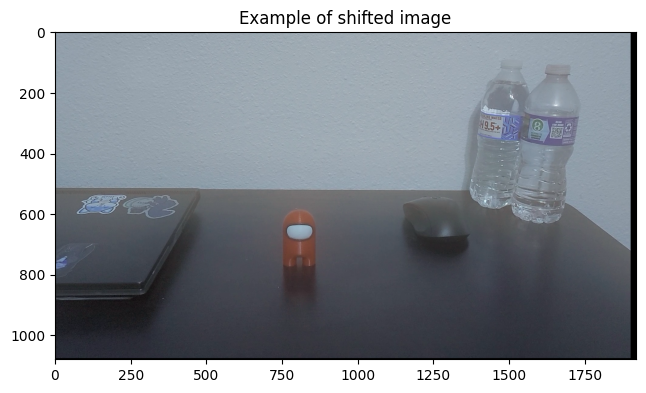

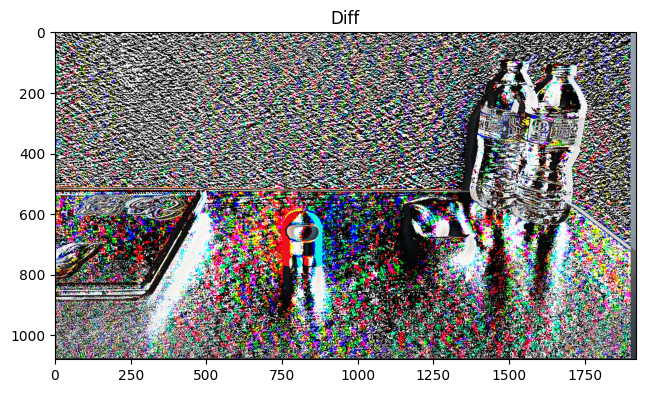

In [84]:
# Depending on you you've implemented the pixel_shift operations
# You might need to switch dx and dy. Here's the combination that worked for me
# Think about why I multiply with -1 !!! (you might need this too)

# k = 44*5    # index of image to translate
k = 12

# pixel shifts are y, x
# so we need to pass the y pixel shifts (0) as dy

dx = -1*pixel_shifts[1,k]
dy = -1*pixel_shifts[0,k]

img_translated = translate_image(imgs[:,:,:,k],dy,dx)

print(img_translated.dtype)

plt.figure(figsize=(7.5,5))
plt.imshow(imgs[:,:,:,0])
plt.title("Initial frame image")

plt.figure(figsize=(7.5,5))
plt.imshow(imgs[:,:,:,k])
plt.title("Example of original image")

plt.figure(figsize=(7.5,5))
plt.imshow(img_translated)
plt.title("Example of shifted image")

plt.figure(figsize=(7.5,5))
plt.imshow(imgs[:,:,:,k]-img_translated)
plt.title("Diff")

x0 = top_left_search_window[0] # this is x, y
x1 = x0 + window_size
y0 = top_left_search_window[1]
y1 = y0 + window_size

print(dx, dy)
print(x0, x1, y0, y1)

**Sanity check: Has the image been registered correctly?**

Use this code to check if you registration approach has actually worked.

The following code should show on the left the original image, in the middle the original image that you want to register before shifting and on the right the image after shifting.

The left and right image should now more or less overlap. If they are not registered, revisit your correlation or translation functions and try to identify the problem!

Save Name:  ./my_output_synthetic/proof_image_shift_and_registration_works.png


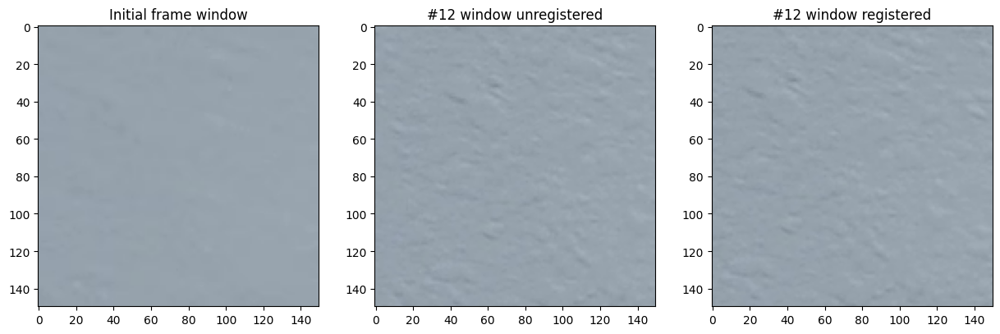

In [85]:
plt.figure(figsize=(15,15))
plt.subplot(131)
plt.imshow(imgs[x0:x1,y0:y1,:,0])
plt.title("Initial frame window")
plt.subplot(132)
plt.imshow(imgs[x0:x1,y0:y1,:,k])
plt.title("#" +str(k) + " window unregistered")
plt.subplot(133)
plt.imshow(img_translated[x0:x1,y0:y1,:])
plt.title("#" +str(k) + " window registered")

util_synthetic.save_fig_as_png("proof_image_shift_and_registration_works")

### Task 5.2: Traslate all the images
After you've successully implemented a function that can translate one image, you'll now have to implement a function that translates all images according to the calculated pixel_shifts.

You can use a for-loop for looping through the images and call the translate_image that you've implemented above

In [86]:
print(imgs.shape)
print(pixel_shifts.shape)

(1080, 1920, 3, 112)
(2, 112)


In [87]:
def translate_all_images(imgs,pixel_shifts):
    """
    TODO:

    Translates all images in the vido given the amount
    defined by pixel_shifts that you retrieve from
    calculate_pixel_shifts

    Args:
        imgs(ndarray): RGB-video array
        pixel_shifts(ndarray): pixel shifts (2,Num_x)

    Returns:
        out(ndarray): shifted images with same shape as imgs

    """

    out = np.zeros_like(imgs)

    for frame in range(imgs.shape[-1]):
      # pixel shifts are y, x
      out[:,:,:,frame] = translate_image(imgs[:,:,:,frame], -1*pixel_shifts[0, frame], -1*pixel_shifts[1, frame])


    return out.astype('uint8')

In [88]:
imgs_translated = translate_all_images(imgs,pixel_shifts)

print(imgs.shape) # Those should have the same size now
print(imgs_translated.shape) # Those should now have the same size as imgs
print(imgs_translated.dtype) # Can be float or uint8. Doesn't really matter

print(imgs_translated.max())

(1080, 1920, 3, 112)
(1080, 1920, 3, 112)
uint8
255


**Sanity check: Have all the images been registered correctly?**


Now we will visualize how well the registration has worked. You can use the functions that we've already implemented for you to do this. This is simply to check that everything you've implemented is actually correct.

Save Name:  ./my_output_synthetic/image_registration_after_shifting.png


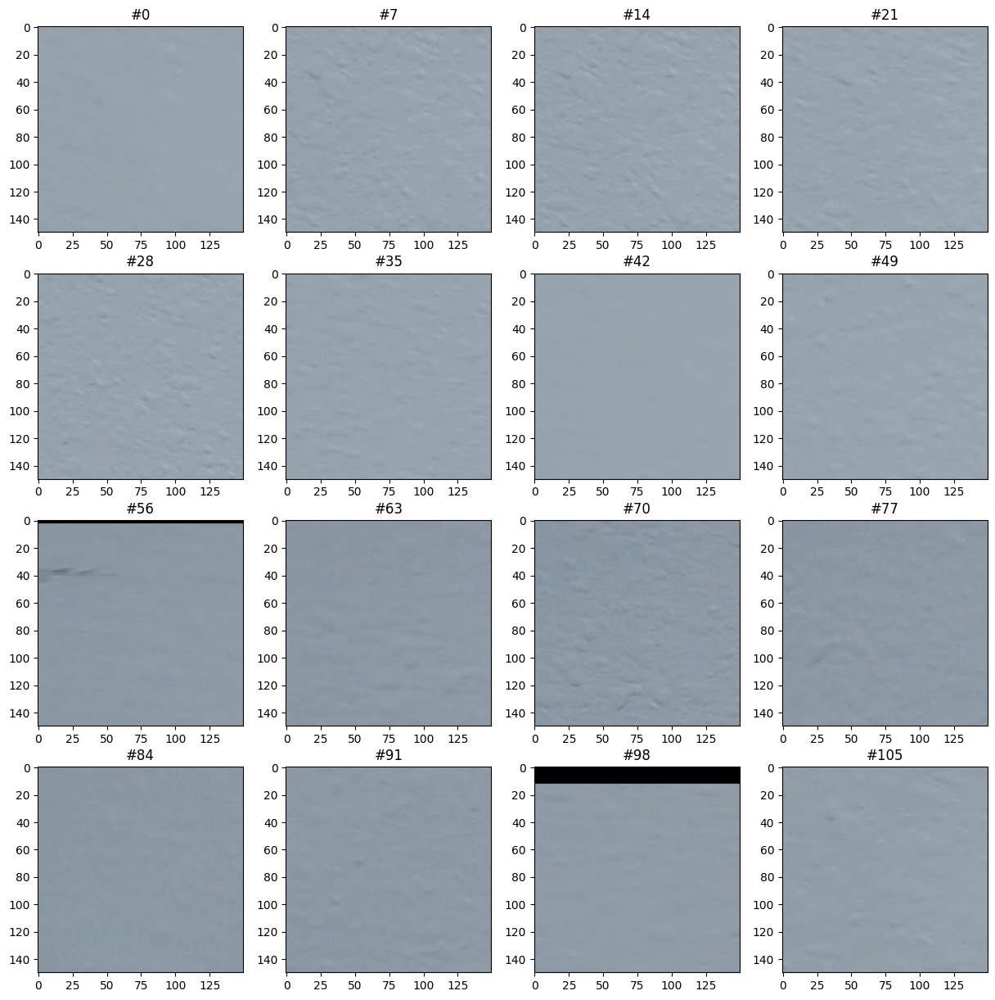

In [89]:
m_plots = 4
n_plots = 4

# according to the dimensions of pixel shift, x and y are switched, but theyre also switched in the display and only used for that so it's ok

x0 = top_left_search_window[0]
x1 = x0 + window_size
y0 = top_left_search_window[1]
y1 = y0 + window_size

plt.figure(figsize=(15,15))
util_synthetic.visualizePixelShift(imgs_translated[x0:x1,y0:y1,:,:])

util_synthetic.save_fig_as_png("image_registration_after_shifting")

Check the registration of several images at full scale

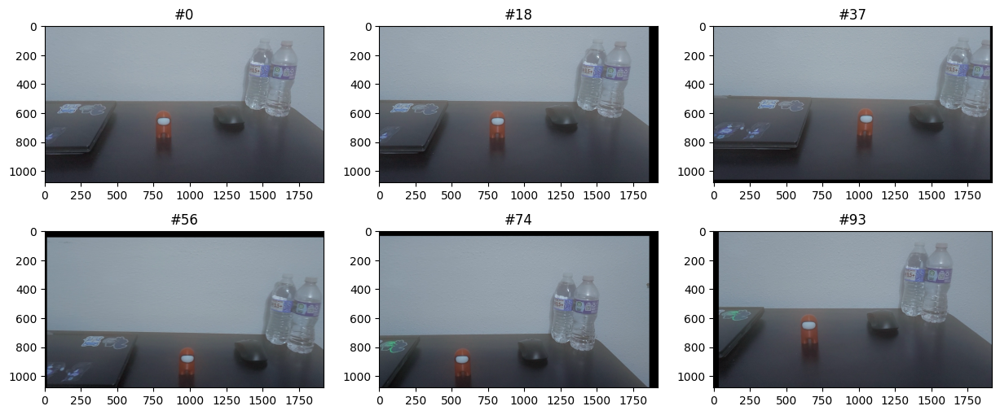

In [90]:
plt.figure(figsize=(15,6))
util_synthetic.visualizePixelShift(imgs_translated,2,3)

Now check and make sure that the feature you registered against is actually in the center now!

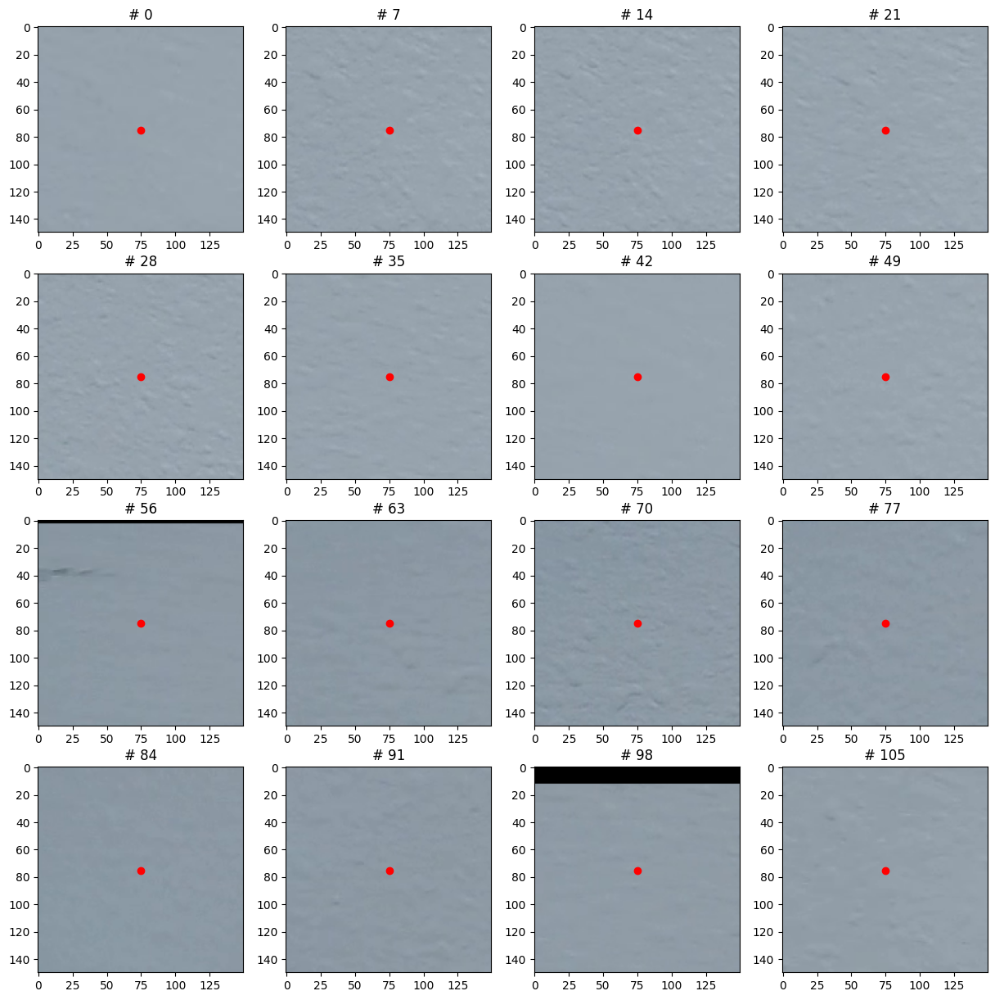

In [91]:
plt.figure(figsize=(15,15))
util_synthetic.show_registered_images(imgs_translated,top_left_search_window,window_size)

### Task 5.3 Average over all images to synthetically refocus
After computing the translation and completing the registration all that is left is to average over all the images. The final result should look like a image taken with a large aperture camera (small depth of field).

If the image looks weird or not as expected, try to identify where the problem is in your code and solve it. You can write questions on Campuswire describing what you did, what worked, and where you think you are stuck. We will try to help you figure it out! Also you can come to TA office hours for help.

In [92]:
print(imgs_translated.shape)

(1080, 1920, 3, 112)


In [93]:
def average_images(imgs):
    """
    TODO:

    Averages the image stack along the temporal dimension.
    This is a one-linear. Do not USE a for-loop for this.

    Args:
        imgs(ndarray): RGB array with several frames

    Returns:
        out(ndarray): average RGB image over the temporal dimensions

    """

    out = np.mean(imgs, axis=-1)
    out = np.asarray(out, dtype=int)

    return out

(1080, 1920, 3)
int64
Save Name:  ./my_output_synthetic/image_synthethic_one.png


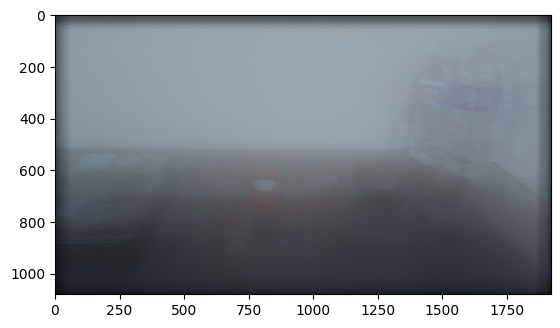

In [94]:
img_synthethic = average_images(imgs_translated)
print(img_synthethic.shape)
print(img_synthethic.dtype)

plt.imshow(img_synthethic)

util_synthetic.save_fig_as_png("image_synthethic_one")

## Task 6: Build Full Synthetic Aperture Pipeline
Currently, we have implemented the refocusing algorithm for only a specific point. However, we'd like to have an algorithm that can focus on any point in the image.

This is easy. All we have to do is choose a different center of focus. We then redefine the sesarch-window and the template of the first frame. Then we do exactly the same pipeline we have developped above and we're done.

In order to save some time for you, we have already implemented this function for you. You can check it out under "calculate_synthethic_aperture_image". Just by glancing over, you should be immediately see what steps we are performing and you should recognize everything that you've implemented in part 2.

In [95]:
def calculate_synthethic_aperture_image(imgs,focus_center=(120,210),window_size=180,template_size = 30,method='cv2.TM_CCOEFF_NORMED'):
    """

    Args:

    Returns:
        synthetically refocused image

    """
    # The template size. This parameter might need to be varied to work well

    window, template, top_left_search_window, top_left_template= crop_search_window(imgs,window_size,template_size,focus_center)
    print(window.shape, template.shape)
    window, template, top_left_search_window, top_left_template = window.squeeze(), template.squeeze(), top_left_search_window.squeeze(), top_left_template.squeeze()

    template = template[:,:,:,0]

    correlated, top_left_correlated_list = findCorrelationAll(window,template,method)
    top_left_correlated = correct_correlation_result_to_image_coordinates(top_left_correlated_list,imgs,window,template)
    pixel_shifts = calculate_pixel_shifts(top_left_correlated)
    imgs_translated = translate_all_images(imgs,pixel_shifts)
    img_synthethic = average_images(imgs_translated)

    return img_synthethic

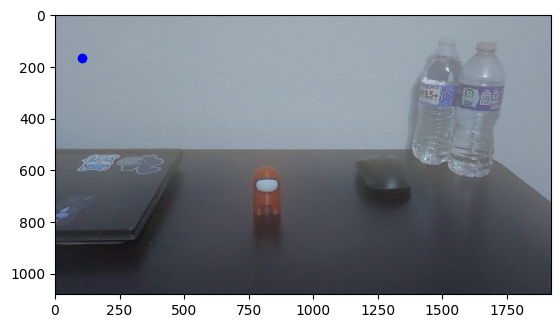

In [96]:
# Let's start by choosing a different point of focus.
# Here we're choosing the northwestern bottle as indicated as
# the blue point on the image.

focus_center=np.array([165,105])
plt.imshow(imgs[:,:,:,0])
plt.scatter(focus_center[1],focus_center[0],color='b')



Now all that is left to do is to run the full synthetic aperture imaging pipeline. Hopefully it works out of the box!

In [97]:
imgs.shape, focus_center

((1080, 1920, 3, 112), array([165, 105]))

(150, 150, 3, 112) (30, 30, 3, 112)
(150, 150, 3, 112) (30, 30, 3)
[165 105] (150, 150, 3, 112) (30, 30, 3)
(1080, 1920, 3)
Save Name:  ./my_output_synthetic/image_synthethic_northwestern_bottle.png


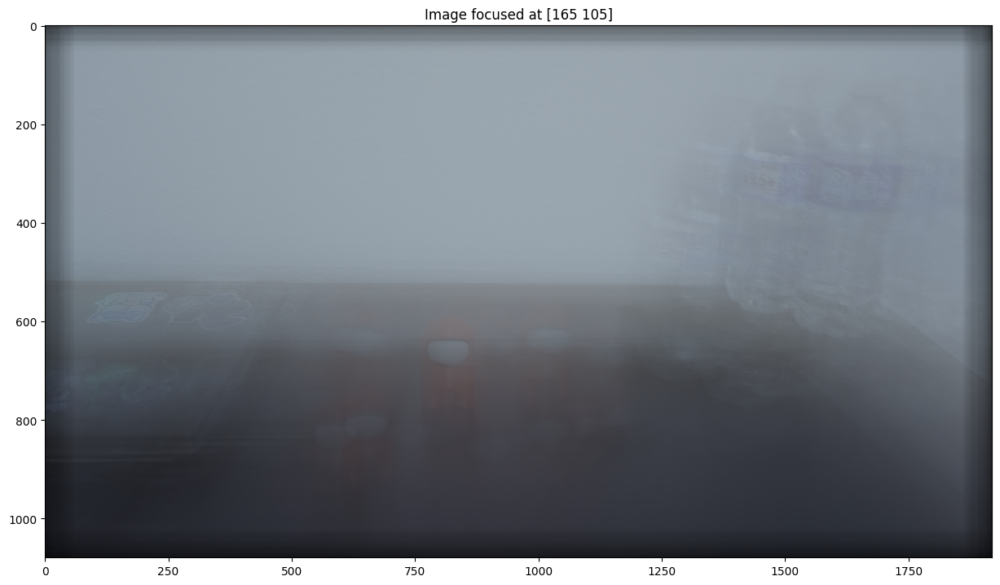

In [98]:
img_synthethic = calculate_synthethic_aperture_image(imgs,focus_center,window_size=150,template_size = 30)

print(img_synthethic.shape)

plt.figure(figsize=(15,10))
plt.imshow(img_synthethic)
plt.title("Image focused at " + str(focus_center))

util_synthetic.save_fig_as_png("image_synthethic_northwestern_bottle")

### Task 6.1: Play around with the refocusing widget
Use the following cell which has some code for you that does interactive refocusing and play around with the algorithm. You can use this interactive viewer later for you own synthethic aperture video.

150
30


interactive(children=(IntSlider(value=76, description='x', max=1004, min=76), IntSlider(value=76, description=…

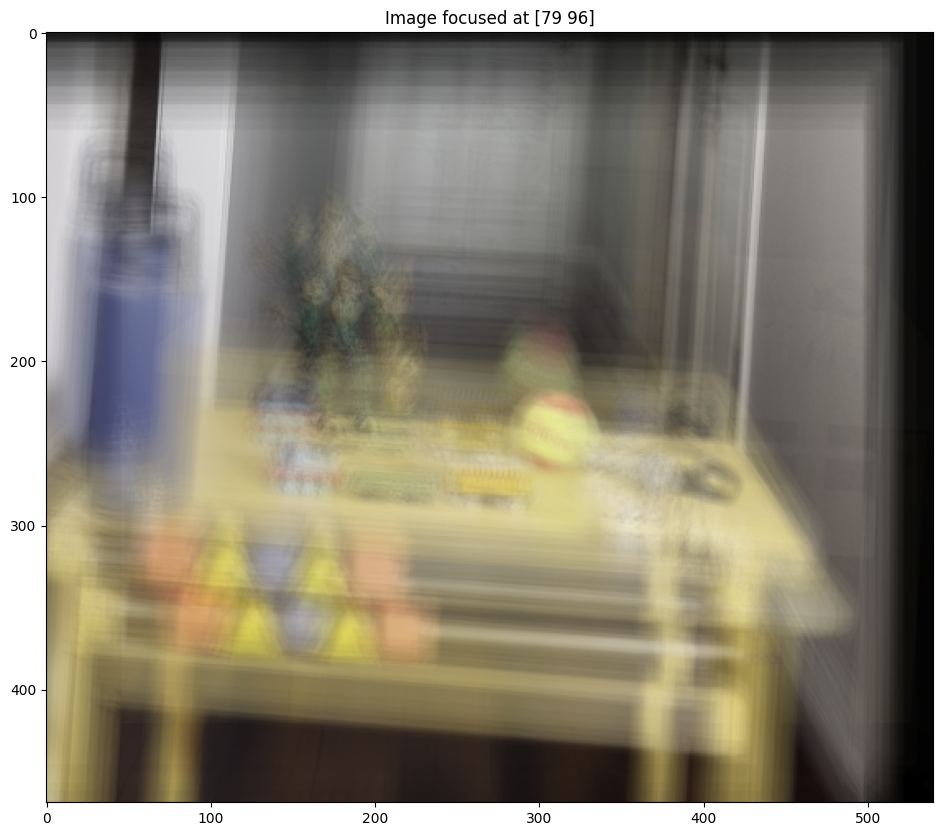

<Figure size 1500x1000 with 0 Axes>

<Figure size 1500x1000 with 0 Axes>

In [99]:
def f(x,y,refocus):
    # plt.clf()
    plt.figure()
    plt.imshow(imgs[:,:,:,0])
    plt.scatter(y,x,color='r')

    focus_center = np.array([x, y])

    print(focus_center)
    plt.title("Image focused at " + str(focus_center))

    plt.show()

    if refocus:
        # plt.clf()
        plt.figure(figsize=(15,10))
        img_synthethic = calculate_synthethic_aperture_image(imgs,focus_center,window_size,template_size)
        plt.imshow(img_synthethic)
        plt.title("Image focused at " + str(focus_center))

print(window_size)
print(template_size)

x_widget =  widgets.IntSlider(value = window_size/2,min=window_size/2+1, max=imgs.shape[0]-1-window_size/2, step=1)
y_widget =  widgets.IntSlider(value = window_size/2,min=window_size/2+1, max=imgs.shape[1]-1-window_size/2, step=1)

interactive_plot = interactive(f, x = x_widget, y = y_widget, refocus = False)
output = interactive_plot.children[-1]
output.layout.height = '15'
interactive_plot

## Task 7: Use your own camera to capture your own light field video


NOTE: You don't have to do this now. You can do this AFTER you've implement your algorithm since we are providing you with an example movie which is ensured to work fine.

You can use any Android/iPhone camera application that records a video. You don't even have to use a smartphone. Any camera device will do the job. You will capture a video as you wave your camera around in front of a static scene.

Here are some guidelines that should help you capture a video:


1.    You need to avoid tilting and rotating the camera as much as possible. You should just shift the camera in a plane (see Figure 1). You may need to try this several times before you capture a good video.
2.    You should press the phone against a flat object (book, wall, etc.) to help guide the planar motion
3.    Experiment with different types of camera motion. You can try moving the camera in a zig-zag motion (as in Figure 1). You can also try using circular motion. In general, the more you cover the plane, the better your results in the next section will be.
4.    Make sure your video is not too long. You should capture a few seconds of video.
5.    Capture a scene with a few objects at different depths. See Figure 2 for an example. In the next section you will create narrow synthetic aperture images that are focused on these objects
6.    Make sure that all of the objects in the scene are in focus. As long as objects are about a meter in size and 1-2 meters away, they will more or less be in focus.

In [107]:
# After the implementation for this dataset you want to replace this with your own movie file
# For now you can keep it though
# path = 'test_video.mov'
path = 'amogus_lightfield.mp4'

In [108]:
# We're implementing this for you for the .mov file datatype.
# It might work for you movie files out-of-the-box. But must likely you'll
# need to adapt this slightly

imgs = util_synthetic.my_read_video_to_array(path)

imgs = imgs[:,:,:,::10] # only take every 10th frame

print(imgs.shape) # Should be (Num_x, Num_y, 3, Num_images)

frameCount 224
(540, 960, 3, 23)


Text(0.5, 1.0, 'An example image from the dataset')

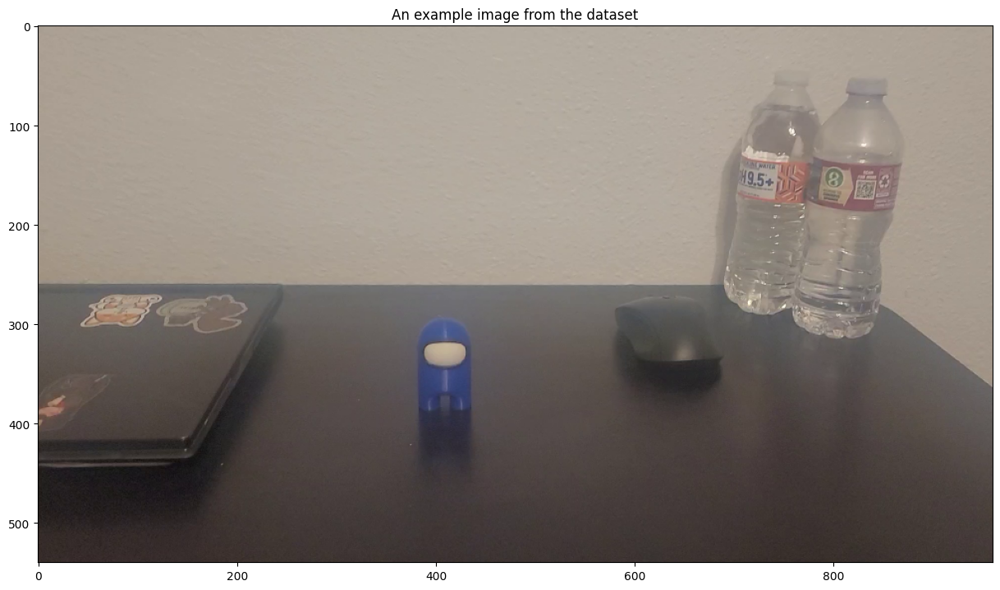

In [109]:
# Print a frame from the video, play around with the index to see that different
# images were loaded correctly
img_idx = 0
plt.figure(figsize=(15,15))
plt.imshow(imgs[:,:,:,0])
plt.title("An example image from the dataset")

Choose a focus center and generate a synthetic aperture photograph. Make sure to upload your **best** result in your final report!

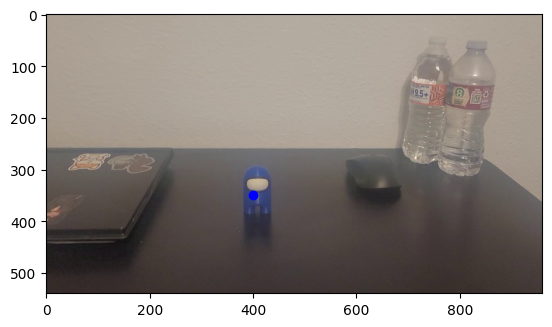

In [114]:
# Let's start by choosing a different point of focus.
# It will be indicated by a blue dot on the image below.

focus_center=np.array([350,400])
plt.imshow(imgs[:,:,:,0])
plt.scatter(focus_center[1],focus_center[0],color='b')



(300, 300, 3, 23) (100, 100, 3, 23)
(300, 300, 3, 23) (100, 100, 3)
[350 400] (300, 300, 3, 23) (100, 100, 3)
(540, 960, 3)
Save Name:  ./my_output_synthetic/image_synthetic_custom.png


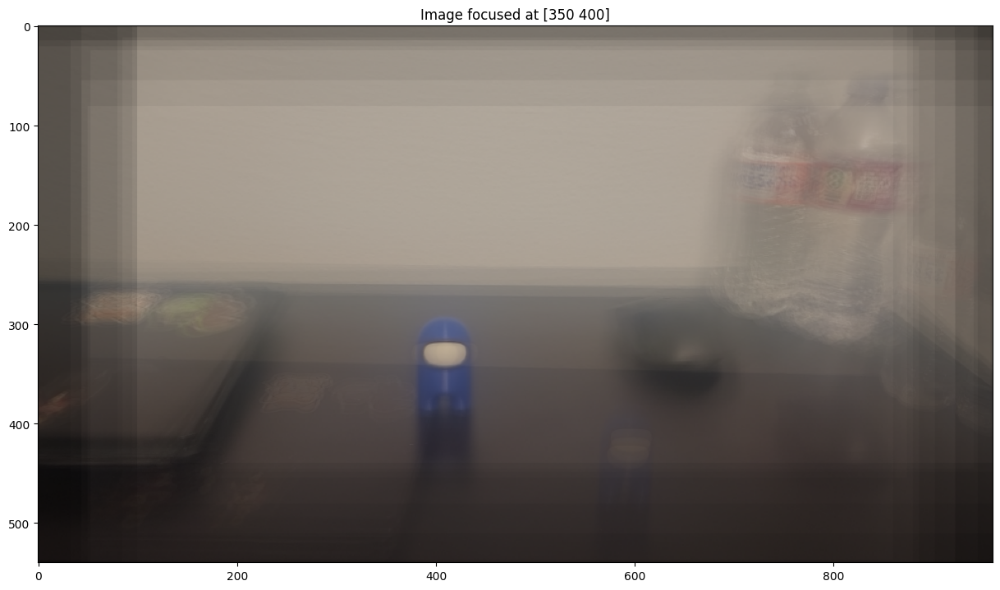

In [115]:
img_synthethic = calculate_synthethic_aperture_image(imgs,focus_center,window_size=300,template_size = 100)

print(img_synthethic.shape)

plt.figure(figsize=(15,10))
plt.imshow(img_synthethic)
plt.title("Image focused at " + str(focus_center))

util_synthetic.save_fig_as_png("image_synthetic_custom")

Use the code below to zip your results folder so that you can download it from the Colab notebook onto your computer.

In [112]:
!zip -r /content/my_output_synthethic.zip /content/my_output_synthethic/

	zip warning: name not matched: /content/my_output_synthethic/

zip error: Nothing to do! (try: zip -r /content/my_output_synthethic.zip . -i /content/my_output_synthethic/)


In [113]:
!ls

amogus_lightfield.mp4		my_output_synthetic  synthetic_aperture.py  util_synthetic.py
example_synthetic_aperture.MOV	__pycache__	     test_video.mov
